#### Challenge 1   
  
- Open up a new IPython notebook
- Download a few MTA turnstile data files
- Open up a file, use csv reader to read it, make a python dict where
  there is a key for each (C/A, UNIT, SCP, STATION). These are the
  first four columns. The value for this key should be a list of
  lists. Each list in the list is the rest of the columns in a
  row. For example, one key-value pair should look like


{    ('A002','R051','02-00-00','LEXINGTON AVE'):
[
['NQR456', 'BMT', '01/03/2015', '03:00:00', 'REGULAR', '0004945474', '0001675324'],
['NQR456', 'BMT', '01/03/2015', '07:00:00', 'REGULAR', '0004945478', '0001675333'],
['NQR456', 'BMT', '01/03/2015', '11:00:00', 'REGULAR', '0004945515', '0001675364'],
...
]
}

In [95]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import collections
%matplotlib inline

In [94]:
df = pd.read_csv('turnstile_180922.txt')
df.rename(index=str, columns={df.columns[-1]: "EXITS"}, inplace=True)
print(df.columns)

dt = df.DATE + ' '+ df.TIME

df['DATETIME'] = pd.to_datetime(dt, infer_datetime_format=True)
df['KEY'] = df.STATION + ' ' + df['C/A']+ ' '+df.UNIT+ ' '+df.SCP



Index(['C/A', 'UNIT', 'SCP', 'STATION', 'LINENAME', 'DIVISION', 'DATE', 'TIME',
       'DESC', 'ENTRIES', 'EXITS'],
      dtype='object')
Pandas(Index='0', _1='A002', UNIT='R051', SCP='02-00-00', STATION='59 ST', LINENAME='NQR456W', DIVISION='BMT', DATE='09/15/2018', TIME='00:00:00', DESC='REGULAR', ENTRIES=6759219, EXITS=2291425, DATETIME=Timestamp('2018-09-15 00:00:00'), KEY='59 ST A002 R051 02-00-00')
Pandas(Index='1', _1='A002', UNIT='R051', SCP='02-00-00', STATION='59 ST', LINENAME='NQR456W', DIVISION='BMT', DATE='09/15/2018', TIME='04:00:00', DESC='REGULAR', ENTRIES=6759234, EXITS=2291429, DATETIME=Timestamp('2018-09-15 04:00:00'), KEY='59 ST A002 R051 02-00-00')
Pandas(Index='2', _1='A002', UNIT='R051', SCP='02-00-00', STATION='59 ST', LINENAME='NQR456W', DIVISION='BMT', DATE='09/15/2018', TIME='08:00:00', DESC='REGULAR', ENTRIES=6759251, EXITS=2291453, DATETIME=Timestamp('2018-09-15 08:00:00'), KEY='59 ST A002 R051 02-00-00')
Pandas(Index='3', _1='A002', UNIT='R051', SCP='02-00

Pandas(Index='2613', _1='A016', UNIT='R081', SCP='03-06-01', STATION='49 ST', LINENAME='NQRW', DIVISION='BMT', DATE='09/20/2018', TIME='16:00:00', DESC='REGULAR', ENTRIES=67143136, EXITS=51309, DATETIME=Timestamp('2018-09-20 16:00:00'), KEY='49 ST A016 R081 03-06-01')
Pandas(Index='2614', _1='A016', UNIT='R081', SCP='03-06-01', STATION='49 ST', LINENAME='NQRW', DIVISION='BMT', DATE='09/20/2018', TIME='20:00:00', DESC='REGULAR', ENTRIES=67143174, EXITS=51327, DATETIME=Timestamp('2018-09-20 20:00:00'), KEY='49 ST A016 R081 03-06-01')
Pandas(Index='2615', _1='A016', UNIT='R081', SCP='03-06-01', STATION='49 ST', LINENAME='NQRW', DIVISION='BMT', DATE='09/21/2018', TIME='00:00:00', DESC='REGULAR', ENTRIES=67143182, EXITS=51336, DATETIME=Timestamp('2018-09-21 00:00:00'), KEY='49 ST A016 R081 03-06-01')
Pandas(Index='2616', _1='A016', UNIT='R081', SCP='03-06-01', STATION='49 ST', LINENAME='NQRW', DIVISION='BMT', DATE='09/21/2018', TIME='04:00:00', DESC='REGULAR', ENTRIES=67143182, EXITS=51336,

Pandas(Index='4613', _1='A033', UNIT='R170', SCP='02-00-00', STATION='14 ST-UNION SQ', LINENAME='LNQR456W', DIVISION='BMT', DATE='09/19/2018', TIME='17:00:00', DESC='REGULAR', ENTRIES=1946484, EXITS=4905741, DATETIME=Timestamp('2018-09-19 17:00:00'), KEY='14 ST-UNION SQ A033 R170 02-00-00')
Pandas(Index='4614', _1='A033', UNIT='R170', SCP='02-00-00', STATION='14 ST-UNION SQ', LINENAME='LNQR456W', DIVISION='BMT', DATE='09/19/2018', TIME='21:00:00', DESC='REGULAR', ENTRIES=1946999, EXITS=4906463, DATETIME=Timestamp('2018-09-19 21:00:00'), KEY='14 ST-UNION SQ A033 R170 02-00-00')
Pandas(Index='4615', _1='A033', UNIT='R170', SCP='02-00-00', STATION='14 ST-UNION SQ', LINENAME='LNQR456W', DIVISION='BMT', DATE='09/20/2018', TIME='01:00:00', DESC='REGULAR', ENTRIES=1947064, EXITS=4906526, DATETIME=Timestamp('2018-09-20 01:00:00'), KEY='14 ST-UNION SQ A033 R170 02-00-00')
Pandas(Index='4616', _1='A033', UNIT='R170', SCP='02-00-00', STATION='14 ST-UNION SQ', LINENAME='LNQR456W', DIVISION='BMT', 

Pandas(Index='6612', _1='A043', UNIT='R462', SCP='00-00-00', STATION='CANAL ST', LINENAME='JNQRZ6W', DIVISION='BMT', DATE='09/15/2018', TIME='17:00:00', DESC='REGULAR', ENTRIES=370859523, EXITS=455285395, DATETIME=Timestamp('2018-09-15 17:00:00'), KEY='CANAL ST A043 R462 00-00-00')
Pandas(Index='6613', _1='A043', UNIT='R462', SCP='00-00-00', STATION='CANAL ST', LINENAME='JNQRZ6W', DIVISION='BMT', DATE='09/15/2018', TIME='21:00:00', DESC='REGULAR', ENTRIES=370860092, EXITS=455286056, DATETIME=Timestamp('2018-09-15 21:00:00'), KEY='CANAL ST A043 R462 00-00-00')
Pandas(Index='6614', _1='A043', UNIT='R462', SCP='00-00-00', STATION='CANAL ST', LINENAME='JNQRZ6W', DIVISION='BMT', DATE='09/16/2018', TIME='01:00:00', DESC='REGULAR', ENTRIES=370860338, EXITS=455286211, DATETIME=Timestamp('2018-09-16 01:00:00'), KEY='CANAL ST A043 R462 00-00-00')
Pandas(Index='6615', _1='A043', UNIT='R462', SCP='00-00-00', STATION='CANAL ST', LINENAME='JNQRZ6W', DIVISION='BMT', DATE='09/16/2018', TIME='05:00:00'

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index='34607', _1='H039', UNIT='R375', SCP='00-00-02', STATION='NEW LOTS', LINENAME='L', DIVISION='BMT', DATE='09/16/2018', TIME='17:00:00', DESC='REGULAR', ENTRIES=5173736, EXITS=10709634, DATETIME=Timestamp('2018-09-16 17:00:00'), KEY='NEW LOTS H039 R375 00-00-02')
Pandas(Index='34608', _1='H039', UNIT='R375', SCP='00-00-02', STATION='NEW LOTS', LINENAME='L', DIVISION='BMT', DATE='09/16/2018', TIME='21:00:00', DESC='REGULAR', ENTRIES=5173804, EXITS=10709659, DATETIME=Timestamp('2018-09-16 21:00:00'), KEY='NEW LOTS H039 R375 00-00-02')
Pandas(Index='34609', _1='H039', UNIT='R375', SCP='00-00-02', STATION='NEW LOTS', LINENAME='L', DIVISION='BMT', DATE='09/17/2018', TIME='01:00:00', DESC='REGULAR', ENTRIES=5173847, EXITS=10709692, DATETIME=Timestamp('2018-09-17 01:00:00'), KEY='NEW LOTS H039 R375 00-00-02')
Pandas(Index='34610', _1='H039', UNIT='R375', SCP='00-00-02', STATION='NEW LOTS', LINENAME='L', DIVISION='BMT', DATE='09/17/2018', TIME='05:00:00', DESC='REGULAR', ENTRIES=51

Pandas(Index='37230', _1='J009', UNIT='R378', SCP='00-00-00', STATION='MYRTLE AV', LINENAME='JMZ', DIVISION='BMT', DATE='09/16/2018', TIME='01:00:00', DESC='REGULAR', ENTRIES=14716061, EXITS=22753713, DATETIME=Timestamp('2018-09-16 01:00:00'), KEY='MYRTLE AV J009 R378 00-00-00')
Pandas(Index='37231', _1='J009', UNIT='R378', SCP='00-00-00', STATION='MYRTLE AV', LINENAME='JMZ', DIVISION='BMT', DATE='09/16/2018', TIME='05:00:00', DESC='REGULAR', ENTRIES=14716137, EXITS=22753969, DATETIME=Timestamp('2018-09-16 05:00:00'), KEY='MYRTLE AV J009 R378 00-00-00')
Pandas(Index='37232', _1='J009', UNIT='R378', SCP='00-00-00', STATION='MYRTLE AV', LINENAME='JMZ', DIVISION='BMT', DATE='09/16/2018', TIME='09:00:00', DESC='REGULAR', ENTRIES=14716324, EXITS=22754153, DATETIME=Timestamp('2018-09-16 09:00:00'), KEY='MYRTLE AV J009 R378 00-00-00')
Pandas(Index='37233', _1='J009', UNIT='R378', SCP='00-00-00', STATION='MYRTLE AV', LINENAME='JMZ', DIVISION='BMT', DATE='09/16/2018', TIME='13:00:00', DESC='REG

Pandas(Index='39426', _1='J034', UNIT='R007', SCP='00-00-02', STATION='104 ST', LINENAME='JZ', DIVISION='BMT', DATE='09/16/2018', TIME='00:00:00', DESC='REGULAR', ENTRIES=2025954342, EXITS=622100836, DATETIME=Timestamp('2018-09-16 00:00:00'), KEY='104 ST J034 R007 00-00-02')
Pandas(Index='39427', _1='J034', UNIT='R007', SCP='00-00-02', STATION='104 ST', LINENAME='JZ', DIVISION='BMT', DATE='09/16/2018', TIME='04:00:00', DESC='REGULAR', ENTRIES=2025954342, EXITS=622100836, DATETIME=Timestamp('2018-09-16 04:00:00'), KEY='104 ST J034 R007 00-00-02')
Pandas(Index='39428', _1='J034', UNIT='R007', SCP='00-00-02', STATION='104 ST', LINENAME='JZ', DIVISION='BMT', DATE='09/16/2018', TIME='08:00:00', DESC='REGULAR', ENTRIES=2025954342, EXITS=622100836, DATETIME=Timestamp('2018-09-16 08:00:00'), KEY='104 ST J034 R007 00-00-02')
Pandas(Index='39429', _1='J034', UNIT='R007', SCP='00-00-02', STATION='104 ST', LINENAME='JZ', DIVISION='BMT', DATE='09/16/2018', TIME='12:00:00', DESC='REGULAR', ENTRIES=2

Pandas(Index='42105', _1='N009', UNIT='R174', SCP='01-00-02', STATION='181 ST', LINENAME='A', DIVISION='IND', DATE='09/17/2018', TIME='09:00:00', DESC='REGULAR', ENTRIES=9655879, EXITS=15853773, DATETIME=Timestamp('2018-09-17 09:00:00'), KEY='181 ST N009 R174 01-00-02')
Pandas(Index='42106', _1='N009', UNIT='R174', SCP='01-00-02', STATION='181 ST', LINENAME='A', DIVISION='IND', DATE='09/17/2018', TIME='13:00:00', DESC='REGULAR', ENTRIES=9656236, EXITS=15854054, DATETIME=Timestamp('2018-09-17 13:00:00'), KEY='181 ST N009 R174 01-00-02')
Pandas(Index='42107', _1='N009', UNIT='R174', SCP='01-00-02', STATION='181 ST', LINENAME='A', DIVISION='IND', DATE='09/17/2018', TIME='17:00:00', DESC='REGULAR', ENTRIES=9656519, EXITS=15854510, DATETIME=Timestamp('2018-09-17 17:00:00'), KEY='181 ST N009 R174 01-00-02')
Pandas(Index='42108', _1='N009', UNIT='R174', SCP='01-00-02', STATION='181 ST', LINENAME='A', DIVISION='IND', DATE='09/17/2018', TIME='21:00:00', DESC='REGULAR', ENTRIES=9656712, EXITS=15

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Pandas(Index='72599', _1='N223', UNIT='R156', SCP='01-05-00', STATION='BEDFORD PK BLVD', LINENAME='BD', DIVISION='IND', DATE='09/21/2018', TIME='05:00:00', DESC='REGULAR', ENTRIES=134218315, EXITS=0, DATETIME=Timestamp('2018-09-21 05:00:00'), KEY='BEDFORD PK BLVD N223 R156 01-05-00')
Pandas(Index='72600', _1='N223', UNIT='R156', SCP='01-05-00', STATION='BEDFORD PK BLVD', LINENAME='BD', DIVISION='IND', DATE='09/21/2018', TIME='09:00:00', DESC='REGULAR', ENTRIES=134218315, EXITS=0, DATETIME=Timestamp('2018-09-21 09:00:00'), KEY='BEDFORD PK BLVD N223 R156 01-05-00')
Pandas(Index='72601', _1='N223', UNIT='R156', SCP='01-05-00', STATION='BEDFORD PK BLVD', LINENAME='BD', DIVISION='IND', DATE='09/21/2018', TIME='13:00:00', DESC='REGULAR', ENTRIES=134218315, EXITS=0, DATETIME=Timestamp('2018-09-21 13:00:00'), KEY='BEDFORD PK BLVD N223 R156 01-05-00')
Pandas(Index='72602', _1='N223', UNIT='R156', SCP='01-05-00', STATION='BEDFORD PK BLVD', LINENAME='BD', DIVISION='IND', DATE='09/21/2018', TIME='

Pandas(Index='74910', _1='N305A', UNIT='R016', SCP='00-00-01', STATION='LEXINGTON AV/53', LINENAME='EM6', DIVISION='IND', DATE='09/18/2018', TIME='16:00:00', DESC='REGULAR', ENTRIES=3119987, EXITS=1321513, DATETIME=Timestamp('2018-09-18 16:00:00'), KEY='LEXINGTON AV/53 N305A R016 00-00-01')
Pandas(Index='74911', _1='N305A', UNIT='R016', SCP='00-00-01', STATION='LEXINGTON AV/53', LINENAME='EM6', DIVISION='IND', DATE='09/18/2018', TIME='20:00:00', DESC='REGULAR', ENTRIES=3120334, EXITS=1321554, DATETIME=Timestamp('2018-09-18 20:00:00'), KEY='LEXINGTON AV/53 N305A R016 00-00-01')
Pandas(Index='74912', _1='N305A', UNIT='R016', SCP='00-00-01', STATION='LEXINGTON AV/53', LINENAME='EM6', DIVISION='IND', DATE='09/19/2018', TIME='00:00:00', DESC='REGULAR', ENTRIES=3120385, EXITS=1321563, DATETIME=Timestamp('2018-09-19 00:00:00'), KEY='LEXINGTON AV/53 N305A R016 00-00-01')
Pandas(Index='74913', _1='N305A', UNIT='R016', SCP='00-00-01', STATION='LEXINGTON AV/53', LINENAME='EM6', DIVISION='IND', DA

Pandas(Index='76670', _1='N309A', UNIT='R140', SCP='00-06-03', STATION='QUEENS PLAZA', LINENAME='EMR', DIVISION='IND', DATE='09/18/2018', TIME='17:00:00', DESC='REGULAR', ENTRIES=17774, EXITS=117106, DATETIME=Timestamp('2018-09-18 17:00:00'), KEY='QUEENS PLAZA N309A R140 00-06-03')
Pandas(Index='76671', _1='N309A', UNIT='R140', SCP='00-06-03', STATION='QUEENS PLAZA', LINENAME='EMR', DIVISION='IND', DATE='09/18/2018', TIME='21:00:00', DESC='REGULAR', ENTRIES=17792, EXITS=117211, DATETIME=Timestamp('2018-09-18 21:00:00'), KEY='QUEENS PLAZA N309A R140 00-06-03')
Pandas(Index='76672', _1='N309A', UNIT='R140', SCP='00-06-03', STATION='QUEENS PLAZA', LINENAME='EMR', DIVISION='IND', DATE='09/19/2018', TIME='01:00:00', DESC='REGULAR', ENTRIES=17792, EXITS=117249, DATETIME=Timestamp('2018-09-19 01:00:00'), KEY='QUEENS PLAZA N309A R140 00-06-03')
Pandas(Index='76673', _1='N309A', UNIT='R140', SCP='00-06-03', STATION='QUEENS PLAZA', LINENAME='EMR', DIVISION='IND', DATE='09/19/2018', TIME='05:00:0

Pandas(Index='79097', _1='N323', UNIT='R018', SCP='01-06-01', STATION='JKSN HT-ROOSVLT', LINENAME='EFMR7', DIVISION='IND', DATE='09/18/2018', TIME='09:52:14', DESC='REGULAR', ENTRIES=4414163, EXITS=3582614, DATETIME=Timestamp('2018-09-18 09:52:14'), KEY='JKSN HT-ROOSVLT N323 R018 01-06-01')
Pandas(Index='79098', _1='N323', UNIT='R018', SCP='01-06-01', STATION='JKSN HT-ROOSVLT', LINENAME='EFMR7', DIVISION='IND', DATE='09/18/2018', TIME='12:00:00', DESC='REGULAR', ENTRIES=4414233, EXITS=3582658, DATETIME=Timestamp('2018-09-18 12:00:00'), KEY='JKSN HT-ROOSVLT N323 R018 01-06-01')
Pandas(Index='79099', _1='N323', UNIT='R018', SCP='01-06-01', STATION='JKSN HT-ROOSVLT', LINENAME='EFMR7', DIVISION='IND', DATE='09/18/2018', TIME='16:00:00', DESC='REGULAR', ENTRIES=4414369, EXITS=3582790, DATETIME=Timestamp('2018-09-18 16:00:00'), KEY='JKSN HT-ROOSVLT N323 R018 01-06-01')
Pandas(Index='79100', _1='N323', UNIT='R018', SCP='01-06-01', STATION='JKSN HT-ROOSVLT', LINENAME='EFMR7', DIVISION='IND', D

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Pandas(Index='106592', _1='N606', UNIT='R025', SCP='00-00-01', STATION='JAMAICA CENTER', LINENAME='EJZ', DIVISION='IND', DATE='09/18/2018', TIME='13:26:53', DESC='REGULAR', ENTRIES=1206225706, EXITS=4251544, DATETIME=Timestamp('2018-09-18 13:26:53'), KEY='JAMAICA CENTER N606 R025 00-00-01')
Pandas(Index='106593', _1='N606', UNIT='R025', SCP='00-00-01', STATION='JAMAICA CENTER', LINENAME='EJZ', DIVISION='IND', DATE='09/18/2018', TIME='14:26:28', DESC='REGULAR', ENTRIES=1206225662, EXITS=4251734, DATETIME=Timestamp('2018-09-18 14:26:28'), KEY='JAMAICA CENTER N606 R025 00-00-01')
Pandas(Index='106594', _1='N606', UNIT='R025', SCP='00-00-01', STATION='JAMAICA CENTER', LINENAME='EJZ', DIVISION='IND', DATE='09/18/2018', TIME='16:00:00', DESC='REGULAR', ENTRIES=1206225576, EXITS=4252017, DATETIME=Timestamp('2018-09-18 16:00:00'), KEY='JAMAICA CENTER N606 R025 00-00-01')
Pandas(Index='106595', _1='N606', UNIT='R025', SCP='00-00-01', STATION='JAMAICA CENTER', LINENAME='EJZ', DIVISION='IND', DA

Pandas(Index='108091', _1='N700A', UNIT='R570', SCP='01-00-05', STATION='72 ST-2 AVE', LINENAME='Q', DIVISION='IND', DATE='09/17/2018', TIME='01:00:00', DESC='REGULAR', ENTRIES=918182, EXITS=667112, DATETIME=Timestamp('2018-09-17 01:00:00'), KEY='72 ST-2 AVE N700A R570 01-00-05')
Pandas(Index='108092', _1='N700A', UNIT='R570', SCP='01-00-05', STATION='72 ST-2 AVE', LINENAME='Q', DIVISION='IND', DATE='09/17/2018', TIME='05:00:00', DESC='REGULAR', ENTRIES=918185, EXITS=667120, DATETIME=Timestamp('2018-09-17 05:00:00'), KEY='72 ST-2 AVE N700A R570 01-00-05')
Pandas(Index='108093', _1='N700A', UNIT='R570', SCP='01-00-05', STATION='72 ST-2 AVE', LINENAME='Q', DIVISION='IND', DATE='09/17/2018', TIME='09:00:00', DESC='REGULAR', ENTRIES=918500, EXITS=667772, DATETIME=Timestamp('2018-09-17 09:00:00'), KEY='72 ST-2 AVE N700A R570 01-00-05')
Pandas(Index='108094', _1='N700A', UNIT='R570', SCP='01-00-05', STATION='72 ST-2 AVE', LINENAME='Q', DIVISION='IND', DATE='09/17/2018', TIME='13:00:00', DESC

Pandas(Index='110590', _1='PTH02', UNIT='R544', SCP='00-04-00', STATION='HARRISON', LINENAME='1', DIVISION='PTH', DATE='09/21/2018', TIME='10:42:21', DESC='REGULAR', ENTRIES=14079, EXITS=112144, DATETIME=Timestamp('2018-09-21 10:42:21'), KEY='HARRISON PTH02 R544 00-04-00')
Pandas(Index='110591', _1='PTH02', UNIT='R544', SCP='00-04-00', STATION='HARRISON', LINENAME='1', DIVISION='PTH', DATE='09/21/2018', TIME='14:54:21', DESC='REGULAR', ENTRIES=14108, EXITS=112156, DATETIME=Timestamp('2018-09-21 14:54:21'), KEY='HARRISON PTH02 R544 00-04-00')
Pandas(Index='110592', _1='PTH02', UNIT='R544', SCP='00-04-00', STATION='HARRISON', LINENAME='1', DIVISION='PTH', DATE='09/21/2018', TIME='19:06:21', DESC='REGULAR', ENTRIES=14114, EXITS=112320, DATETIME=Timestamp('2018-09-21 19:06:21'), KEY='HARRISON PTH02 R544 00-04-00')
Pandas(Index='110593', _1='PTH02', UNIT='R544', SCP='00-04-00', STATION='HARRISON', LINENAME='1', DIVISION='PTH', DATE='09/21/2018', TIME='23:18:21', DESC='REGULAR', ENTRIES=1411

Pandas(Index='113090', _1='PTH05', UNIT='R543', SCP='00-01-02', STATION='EXCHANGE PLACE', LINENAME='1', DIVISION='PTH', DATE='09/15/2018', TIME='21:05:32', DESC='REGULAR', ENTRIES=49400, EXITS=138520, DATETIME=Timestamp('2018-09-15 21:05:32'), KEY='EXCHANGE PLACE PTH05 R543 00-01-02')
Pandas(Index='113091', _1='PTH05', UNIT='R543', SCP='00-01-02', STATION='EXCHANGE PLACE', LINENAME='1', DIVISION='PTH', DATE='09/16/2018', TIME='01:17:32', DESC='REGULAR', ENTRIES=49417, EXITS=138780, DATETIME=Timestamp('2018-09-16 01:17:32'), KEY='EXCHANGE PLACE PTH05 R543 00-01-02')
Pandas(Index='113092', _1='PTH05', UNIT='R543', SCP='00-01-02', STATION='EXCHANGE PLACE', LINENAME='1', DIVISION='PTH', DATE='09/16/2018', TIME='05:29:32', DESC='REGULAR', ENTRIES=49419, EXITS=138836, DATETIME=Timestamp('2018-09-16 05:29:32'), KEY='EXCHANGE PLACE PTH05 R543 00-01-02')
Pandas(Index='113093', _1='PTH05', UNIT='R543', SCP='00-01-02', STATION='EXCHANGE PLACE', LINENAME='1', DIVISION='PTH', DATE='09/16/2018', TIM

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [108]:
mydict = collections.defaultdict(list)

#(Index='0', _1='A002', UNIT='R051', SCP='02-00-00', STATION='59 ST', LINENAME='NQR456W', DIVISION='BMT', DATE='09/15/2018', TIME='00:00:00', DESC='REGULAR', ENTRIES=6759219, EXITS=2291425, DATETIME=Timestamp('2018-09-15 00:00:00'), KEY='59 ST A002 R051 02-00-00')

for row in df.itertuples():
    key = (row[1], row[2], row[3], row[4])
    value = [row[5], row[6], row[12], row[10], row[11]]
    mydict[key].append(value)
    

In [115]:
mydict[('A002', 'R051', '02-00-00', '59 ST')]

[['NQR456W', 'BMT', Timestamp('2018-09-15 00:00:00'), 6759219, 2291425],
 ['NQR456W', 'BMT', Timestamp('2018-09-15 04:00:00'), 6759234, 2291429],
 ['NQR456W', 'BMT', Timestamp('2018-09-15 08:00:00'), 6759251, 2291453],
 ['NQR456W', 'BMT', Timestamp('2018-09-15 12:00:00'), 6759330, 2291532],
 ['NQR456W', 'BMT', Timestamp('2018-09-15 16:00:00'), 6759538, 2291574],
 ['NQR456W', 'BMT', Timestamp('2018-09-15 20:00:00'), 6759808, 2291608],
 ['NQR456W', 'BMT', Timestamp('2018-09-16 00:00:00'), 6759951, 2291626],
 ['NQR456W', 'BMT', Timestamp('2018-09-16 04:00:00'), 6759968, 2291630],
 ['NQR456W', 'BMT', Timestamp('2018-09-16 08:00:00'), 6759987, 2291639],
 ['NQR456W', 'BMT', Timestamp('2018-09-16 12:00:00'), 6760045, 2291661],
 ['NQR456W', 'BMT', Timestamp('2018-09-16 16:00:00'), 6760160, 2291672],
 ['NQR456W', 'BMT', Timestamp('2018-09-16 20:00:00'), 6760301, 2291683],
 ['NQR456W', 'BMT', Timestamp('2018-09-17 00:00:00'), 6760373, 2291684],
 ['NQR456W', 'BMT', Timestamp('2018-09-17 04:00:00'

/home/michael/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


TypeError: invalid type promotion

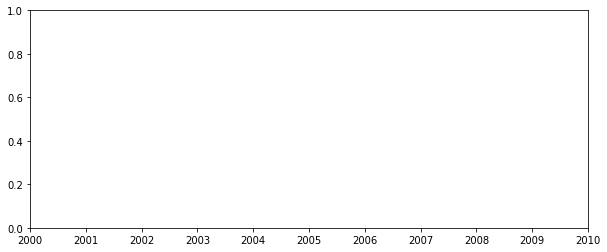

In [116]:
station = '59 ST'

df2 = df[df.STATION==station]
df3 = df2[df.DATE=='09/15/2018']

plt.figure(figsize=(10,4))
plt.scatter(df3.DATETIME, df3.ENTRIES)

In [72]:
df3
#df3.plot(x='DATETIME', y='ENTRIES')

,C/A,UNIT,SCP,STATION,LINENAME,DIVISION,DATE,TIME,DESC,ENTRIES,EXITS,DATETIME
0,A002,R051,02-00-00,59 ST,NQR456W,BMT,09/15/2018,00:00:00,REGULAR,6759219,2291425,2018-09-15 00:00:00
1,A002,R051,02-00-00,59 ST,NQR456W,BMT,09/15/2018,04:00:00,REGULAR,6759234,2291429,2018-09-15 04:00:00
2,A002,R051,02-00-00,59 ST,NQR456W,BMT,09/15/2018,08:00:00,REGULAR,6759251,2291453,2018-09-15 08:00:00
3,A002,R051,02-00-00,59 ST,NQR456W,BMT,09/15/2018,12:00:00,REGULAR,6759330,2291532,2018-09-15 12:00:00
4,A002,R051,02-00-00,59 ST,NQR456W,BMT,09/15/2018,16:00:00,REGULAR,6759538,2291574,2018-09-15 16:00:00
5,A002,R051,02-00-00,59 ST,NQR456W,BMT,09/15/2018,20:00:00,REGULAR,6759808,2291608,2018-09-15 20:00:00
43,A002,R051,02-00-01,59 ST,NQR456W,BMT,09/15/2018,00:00:00,REGULAR,6045231,1353980,2018-09-15 00:00:00
44,A002,R051,02-00-01,59 ST,NQR456W,BMT,09/15/2018,04:00:00,REGULAR,6045246,1353981,2018-09-15 04:00:00
45,A002,R051,02-00-01,59 ST,NQR456W,BMT,09/15/2018,08:00:00,REGULAR,6045257,1353992,2018-09-15 08:00:00
46,A002,R051,02-00-01,59 ST,NQR456W,BMT,09/15/2018,12:00:00,REGULAR,6045323,1354034,2018-09-15 12:00:00


#### Challenge 8

- Make one list of counts for **one** week for one station. Monday's
count, Tuesday's count, etc. so it's a list of 7 counts.
Make the same list for another week, and another week, and another
week.
`plt.plot(week_count_list)` for every `week_count_list` you created
this way. You should get a rainbow plot of weekly commute numbers on
top of each other.

#### Challenge 9

- Over multiple weeks, sum total ridership for each station and sort
  them, so you can find out the stations with the highest traffic
  during the time you investigate

#### Challenge 10

- Make a single list of these total ridership values and plot it with

    plt.hist(total_ridership_counts)

to get an idea about the distribution of total ridership among
different stations.

This should show you that most stations have a small traffic, and the
histogram bins for large traffic volumes have small bars.

*Additional Hint*:

If you want to see which stations take the meat of the traffic, you
can sort the total ridership counts and make a `plt.bar` graph. For
this, you want to have two lists: the indices of each bar, and the